## Title: Credit Card Customer Segmentation using Unsupervised Machine Learning Techniques

##### Dataset obtained from Kaggle: https://www.kaggle.com/datasets/arjunbhasin2013/ccdata

## 1. Obtain / Collect Data
* Understanding the variables in dataset
* Load dataset from url, csv
* Identify dataset shape, size, type

##### A. Understanding the variables in dataset
1. custID : Identification of Credit Card holder (Categorical)
2. remainBal : Balance amount left in their account to make purchases
3. balF : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
4. purDone : Amount of purchases made from account
5. oneOffPur : Maximum purchase amount done in one-go
6. insPur : Amount of purchase done in installment
7. cashAdv : Cash in advance given by the user
8. purF : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
9. oneOffPurF : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
10. insPurF : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
11. cashAdvF : How frequently the cash in advance being paid
12. cashAdvTRX : Number of Transactions made with "Cash in Advanced"
13. purTRX : Numbe of purchase transactions made
14. creditLim : Limit of Credit Card for user
15. pymtDone : Amount of Payment done by user
16. minPymt : Minimum amount of payments made by user
17. fullPymtPCT : Percentage of full payment paid by user
18. tenure : Tenure of credit card service for user

##### Importing libraries

In [1]:
import numpy as np
from numpy import unique
from numpy import where
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.mixture import GaussianMixture

from collections import defaultdict
from sklearn.metrics.pairwise import euclidean_distances

from sklearn.metrics import silhouette_score,calinski_harabasz_score,davies_bouldin_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error

##### B. Load dataset from url, csv

In [2]:
# load data from csv into data frame and check header
dataset_url = 'https://raw.githubusercontent.com/usman2155904/WQD7001/main/CC%20GENERAL.csv'
dfRaw = pd.read_csv(dataset_url)
dfRaw.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


## 2. Scrub Data
* Rename all variables
* Data cleaning: Identify and resolve missing values via cold deck imputation (mean)
* Data Remove customer ID attribute

##### A. Rename all variables

In [3]:
#rename variables and display header
dfUpdated = dfRaw.rename(columns = {'CUST_ID':'custID',
                         'BALANCE':'remainBal', 
                         'BALANCE_FREQUENCY':'balF', 
                         'PURCHASES':'purDone', 
                         'ONEOFF_PURCHASES':'oneOffPur', 
                         'INSTALLMENTS_PURCHASES':'insPur', 
                         'CASH_ADVANCE':'cashAdv', 
                         'PURCHASES_FREQUENCY':'purF', 
                         'ONEOFF_PURCHASES_FREQUENCY':'oneOffPurF', 
                         'PURCHASES_INSTALLMENTS_FREQUENCY': 'insPurF', 
                         'CASH_ADVANCE_FREQUENCY':'cashAdvF', 
                         'CASH_ADVANCE_TRX':'cashAdvTRX', 
                         'PURCHASES_TRX':'purTRX', 
                         'CREDIT_LIMIT':'creditLim', 
                         'PAYMENTS':'pymtDone', 
                         'MINIMUM_PAYMENTS':'minPymt', 
                         'PRC_FULL_PAYMENT':'fullPymtPCT', 
                         'TENURE':'tenure'})
dfUpdated.head()

,custID,remainBal,balF,purDone,oneOffPur,insPur,cashAdv,purF,oneOffPurF,insPurF,cashAdvF,cashAdvTRX,purTRX,creditLim,pymtDone,minPymt,fullPymtPCT,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


##### B. Data cleaning: Identify and resolve missing values via cold deck imputation (mean)

In [4]:
#calculate missing and null values ratio for all attributes
mnv_ratios = [ratio for ratio in (dfUpdated.isna().sum() / len(dfUpdated))] 
print([pair for pair in list(zip(dfUpdated.columns, mnv_ratios)) if pair[1] > 0])

[('creditLim', 0.000111731843575419), ('minPymt', 0.034972067039106144)]


In [5]:
#BEFORE
#count null values of of all attributes
dfUpdated.isnull().sum()

custID           0
remainBal        0
balF             0
purDone          0
oneOffPur        0
insPur           0
cashAdv          0
purF             0
oneOffPurF       0
insPurF          0
cashAdvF         0
cashAdvTRX       0
purTRX           0
creditLim        1
pymtDone         0
minPymt        313
fullPymtPCT      0
tenure           0
dtype: int64

In [6]:
#AFTER
#fill mean values for null value of attributes and count again
dfUpdated['creditLim'].fillna(dfUpdated['creditLim'].mean(), inplace = True)
dfUpdated['minPymt'].fillna(dfUpdated['minPymt'].mean(), inplace = True)
dfUpdated.isnull().sum()

custID         0
remainBal      0
balF           0
purDone        0
oneOffPur      0
insPur         0
cashAdv        0
purF           0
oneOffPurF     0
insPurF        0
cashAdvF       0
cashAdvTRX     0
purTRX         0
creditLim      0
pymtDone       0
minPymt        0
fullPymtPCT    0
tenure         0
dtype: int64

##### C. Remove customer ID attribute

In [7]:
#round off all attribute values of float data type in 4dp
dfNew = dfUpdated.round(4)

#remove custID attribute
dfNew.drop('custID', axis = 1, inplace = True)
dfNew.head(5)

,remainBal,balF,purDone,oneOffPur,insPur,cashAdv,purF,oneOffPurF,insPurF,cashAdvF,cashAdvTRX,purTRX,creditLim,pymtDone,minPymt,fullPymtPCT,tenure
0,40.9007,0.8182,95.40,0.00,95.4,0.0000,0.1667,0.0000,0.0833,0.0000,0,2,1000.0,201.8021,139.5098,0.0000,12
1,3202.4674,0.9091,0.00,0.00,0.0,6442.9455,0.0000,0.0000,0.0000,0.2500,4,0,7000.0,4103.0326,1072.3402,0.2222,12
2,2495.1489,1.0000,773.17,773.17,0.0,0.0000,1.0000,1.0000,0.0000,0.0000,0,12,7500.0,622.0667,627.2848,0.0000,12
3,1666.6705,0.6364,1499.00,1499.00,0.0,205.7880,0.0833,0.0833,0.0000,0.0833,1,1,7500.0,0.0000,864.2065,0.0000,12
4,817.7143,1.0000,16.00,16.00,0.0,0.0000,0.0833,0.0833,0.0000,0.0000,0,1,1200.0,678.3348,244.7912,0.0000,12


In [8]:
dfModel = dfNew.drop(['purF', 'oneOffPurF', 'insPurF', 'cashAdvF', ], axis=1)
dfModel.head()

,remainBal,balF,purDone,oneOffPur,insPur,cashAdv,cashAdvTRX,purTRX,creditLim,pymtDone,minPymt,fullPymtPCT,tenure
0,40.9007,0.8182,95.40,0.00,95.4,0.0000,0,2,1000.0,201.8021,139.5098,0.0000,12
1,3202.4674,0.9091,0.00,0.00,0.0,6442.9455,4,0,7000.0,4103.0326,1072.3402,0.2222,12
2,2495.1489,1.0000,773.17,773.17,0.0,0.0000,0,12,7500.0,622.0667,627.2848,0.0000,12
3,1666.6705,0.6364,1499.00,1499.00,0.0,205.7880,1,1,7500.0,0.0000,864.2065,0.0000,12
4,817.7143,1.0000,16.00,16.00,0.0,0.0000,0,1,1200.0,678.3348,244.7912,0.0000,12


## 4. Model

* Data normalization
* Principal Component Analysis
* Feature selection
* Find appropriate number of clusters
* Apply clustering algorithms

##### A. Data Normalization

In [9]:
# variables have different range of values 
# so first perform data scaling using standard scaler 
scaler = StandardScaler() 
scaled_df = scaler.fit_transform(dfModel) 

# Normalizing the scaled data 
normalizedDF = normalize(scaled_df) 
  
# Converting the numpy array into a pandas DataFrame 
normalizedDF = pd.DataFrame(normalizedDF) 

# view normalized data header
normalizedDF.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.394719,-0.134465,-0.229123,-0.192473,-0.188238,-0.251710,-0.256716,-0.275732,-0.517905,-0.285247,-1.676864e-01,-0.283395,0.194493
1,0.252930,0.043183,-0.150914,-0.114719,-0.146101,0.837443,0.035378,-0.190204,0.221329,0.263112,2.870437e-02,0.075258,0.115923
2,0.288556,0.334336,-0.069483,0.070271,-0.293358,-0.301237,-0.307229,-0.070355,0.533094,-0.247686,-6.560768e-02,-0.339157,0.232762
3,0.025910,-0.536576,0.122460,0.288231,-0.239886,-0.194543,-0.173899,-0.291068,0.435924,-0.315936,-9.105743e-09,-0.277337,0.190335
4,-0.203241,0.293481,-0.261751,-0.196737,-0.257510,-0.264427,-0.269686,-0.312453,-0.512931,-0.206409,-1.505666e-01,-0.297713,0.204319


##### B. Feature selection

In [10]:
normalizedDF.corr()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,1.000000,0.239801,0.094119,0.119326,0.006658,0.485432,0.408218,0.036129,0.391294,0.283871,0.552616,-0.264033,-0.024390
1,0.239801,1.000000,-0.010252,-0.007803,-0.008840,-0.036635,0.044510,0.064918,-0.066716,-0.084462,0.067637,-0.234072,0.196647
2,0.094119,-0.010252,1.000000,0.872043,0.671866,-0.025144,-0.061779,0.736690,0.341442,0.463184,0.125417,0.261320,-0.058460
3,0.119326,-0.007803,0.872043,1.000000,0.223503,-0.004259,-0.026644,0.539654,0.314090,0.406624,0.078765,0.156253,-0.056330
4,0.006658,-0.008840,0.671866,0.223503,1.000000,-0.043841,-0.082770,0.650735,0.204679,0.306960,0.130568,0.283818,-0.031264
5,0.485432,-0.036635,-0.025144,-0.004259,-0.043841,1.000000,0.681263,-0.084073,0.259580,0.430113,0.261071,-0.040322,-0.179855
6,0.408218,0.044510,-0.061779,-0.026644,-0.082770,0.681263,1.000000,-0.092501,0.107121,0.264855,0.241229,-0.088192,-0.130586
7,0.036129,0.064918,0.736690,0.539654,0.650735,-0.084073,-0.092501,1.000000,0.235841,0.299702,0.098523,0.232340,0.002296
8,0.391294,-0.066716,0.341442,0.314090,0.204679,0.259580,0.107121,0.235841,1.000000,0.365204,0.148983,0.154474,-0.017542
9,0.283871,-0.084462,0.463184,0.406624,0.306960,0.430113,0.264855,0.299702,0.365204,1.000000,0.230195,0.196329,-0.046054


In [11]:
#correlation in heatmap
fig = px.imshow(normalizedDF.corr(),  
                title = "<b>Pairwise Correlation Heatmap Plot</b>",
                text_auto = ".2f", 
                color_continuous_scale = px.colors.sequential.RdBu,
                height = 800,
                width = 800)
fig.update_layout(title_font_family="Times New Roman", 
                  title_font_color="maroon", 
                  font_family = "Arial", 
                  font_color = "navy")
fig.update_xaxes(side = "top")

fig.show()

In [12]:
normalized_df = normalizedDF.drop([8, 9, 10], axis = 1)
normalized_df.head()

,0,1,2,3,4,5,6,7,11,12
0,-0.394719,-0.134465,-0.229123,-0.192473,-0.188238,-0.251710,-0.256716,-0.275732,-0.283395,0.194493
1,0.252930,0.043183,-0.150914,-0.114719,-0.146101,0.837443,0.035378,-0.190204,0.075258,0.115923
2,0.288556,0.334336,-0.069483,0.070271,-0.293358,-0.301237,-0.307229,-0.070355,-0.339157,0.232762
3,0.025910,-0.536576,0.122460,0.288231,-0.239886,-0.194543,-0.173899,-0.291068,-0.277337,0.190335
4,-0.203241,0.293481,-0.261751,-0.196737,-0.257510,-0.264427,-0.269686,-0.312453,-0.297713,0.204319


##### C. PCA

In [13]:
# Using PCA for dimension reduction
# It transforms the larger number of variables to smaller group containing most of information
pca = PCA(n_components = 2) 
dfPCA = pca.fit_transform(normalized_df) 
dfPCA = pd.DataFrame(dfPCA) 
dfPCA.columns = ['PCA1', 'PCA2'] 
dfPCA

,PCA1,PCA2
0,0.061246,-0.616802
1,-0.386571,0.315740
2,-0.342796,-0.096259
3,0.123489,-0.215128
4,-0.231434,-0.525088
...,...,...
8945,0.304189,0.122137
8946,0.097883,0.044153
8947,0.255562,0.033235
8948,0.211492,0.017021


##### D. Selection of Number of K

##### (i) Elbow Method

In [14]:
# Elbow Method
distortions = []
K = range(2, 15)
for k in K:
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(dfPCA)
    distortions.append(kmeans.inertia_)

distortions

[1820.50267537132,
 1159.2999127560422,
 794.4934607951274,
 634.3423993442232,
 504.98534638052286,
 410.7450394762132,
 358.0515618081157,
 321.9490060753133,
 293.3812169270744,
 266.9266311232624,
 245.58145921114135,
 228.30512123546654,
 212.03318570744176]

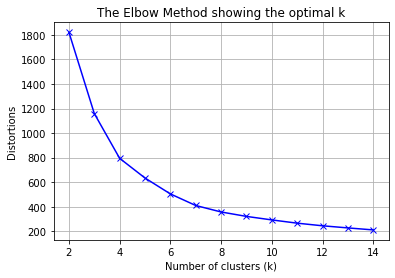

In [15]:
plt.figure()
plt.plot(K, distortions, 'bx-')
plt.grid(True)
plt.xlabel("Number of clusters (k)")
plt.ylabel("Distortions")
plt.title('The Elbow Method showing the optimal k')
plt.show()

##### (ii) Silhouette Score Method

In [16]:
silhouette = []

K = range(2, 15)
for k in K:
    kmeans2 = KMeans(n_clusters = k, random_state = 100)
    predict = kmeans2.fit_predict(dfPCA)

    score = silhouette_score(dfPCA, predict, random_state = 100)
    silhouette.append(score)
    
silhouette

[0.38108117502716066,
 0.3958449747529373,
 0.4069145770889659,
 0.4027847083943003,
 0.43331375729680766,
 0.42577759112127733,
 0.4118752154799035,
 0.38599875890454644,
 0.38024579620864973,
 0.36832298371980116,
 0.37485766589413927,
 0.3627197595870824,
 0.3598143579251656]

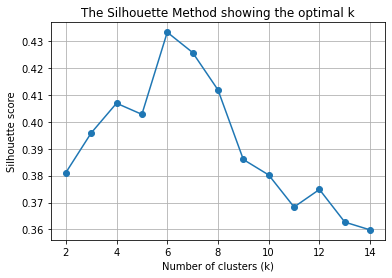

In [17]:
plt.figure()
plt.plot(K, silhouette, marker = 'o')
plt.grid(True)
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette score")
plt.title('The Silhouette Method showing the optimal k')
plt.show()

##### (iii) Davies Bouldin Method

In [18]:
davies_bouldin = []

K = range(2, 15)
for k in K:
    kmeans3 = KMeans(n_clusters = k)
    predict = kmeans3.fit_predict(dfPCA)

    score = davies_bouldin_score(dfPCA, predict)
    davies_bouldin.append(score)
    
davies_bouldin

[1.1040273667966876,
 0.8557319566672407,
 0.8146370579786815,
 0.8211722156504544,
 0.719479787330836,
 0.7120454066176308,
 0.7491023737119298,
 0.811295946573826,
 0.8392168788706348,
 0.8499166940741087,
 0.7915370802642169,
 0.8168116906637052,
 0.8257508125407057]

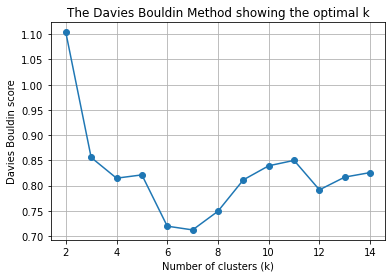

In [19]:
plt.figure()
plt.plot(K, davies_bouldin, marker = 'o')
plt.grid(True)
plt.xlabel("Number of clusters (k)")
plt.ylabel("Davies Bouldin score")
plt.title('The Davies Bouldin Method showing the optimal k')
plt.show()

##### (iv) Calinski Harabasz Method

In [20]:
calinski_harabasz = []

K = range(2, 15)
for k in K:
    kmeans4 = KMeans(n_clusters = k)
    predict = kmeans4.fit_predict(dfPCA)

    score = calinski_harabasz_score(dfPCA, predict)
    calinski_harabasz.append(score)
    
calinski_harabasz

[6282.865565726201,
 7487.509657792436,
 8648.948995596094,
 8688.087055276112,
 9188.200995958941,
 9753.916792856278,
 9778.735922235044,
 9647.124926562057,
 9517.502050329525,
 9483.183043113633,
 9438.445860936565,
 9414.905027166875,
 9383.843904815998]

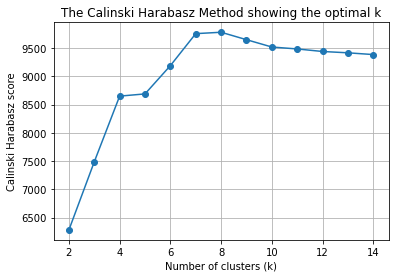

In [21]:
plt.figure()
plt.plot(K, calinski_harabasz, marker = 'o')
plt.grid(True)
plt.xlabel("Number of clusters (k)")
plt.ylabel("Calinski Harabasz score")
plt.title('The Calinski Harabasz Method showing the optimal k')
plt.show()

##### clustering without PCA

K-means inertia: 
4543.395667514771


K-means cluster centers: 
[[ 0.06791667  0.25143169 -0.16597613 -0.12162372 -0.16893569  0.00436377
   0.033836   -0.18597974 -0.24933191  0.14119489]
 [-0.22074986 -0.45341771 -0.10680559 -0.08375888 -0.09853218 -0.08622023
  -0.10446933 -0.13372547  0.03302763 -0.16807574]
 [-0.10906067  0.16511596  0.16119523  0.10539207  0.18734425 -0.14391088
  -0.13983367  0.24104753  0.18302716  0.11456709]]


Silhouette Score:  0.24660015070866922
Calinski Harabasz Score:  2187.5507251868494
Davies Bouldin Score:  1.6064952942821467


Clusters count: 
0    4287
2    2477
1    2186
Name: cluster, dtype: int64


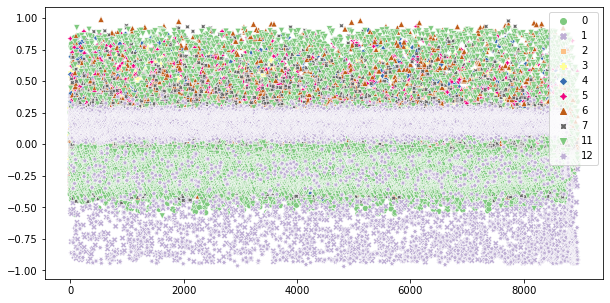

In [22]:
kmean = KMeans(n_clusters = 3, init = 'random', random_state = 1, n_init = 10)
results = kmean.fit_predict(normalized_df)

labels = kmean.labels_
clusters = pd.concat([normalized_df, pd.DataFrame({'cluster':labels})], axis = 1)

print("K-means inertia: ")
print(kmean.inertia_)
print("\n")
print("K-means cluster centers: ")
print(kmean.cluster_centers_)
print("\n")

print("Silhouette Score: ", silhouette_score(normalized_df, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(normalized_df, results))
print("Davies Bouldin Score: ", davies_bouldin_score(normalized_df, results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax = sns.scatterplot(data = normalized_df, palette = "Accent")

plt.legend()
plt.show()

Silhouette Score:  0.22449777081467182
Calinski Harabasz Score:  1872.006911409449
Davies Bouldin Score:  1.7257197083997868


Clusters count: 
0    4267
1    2638
2    2045
Name: cluster, dtype: int64


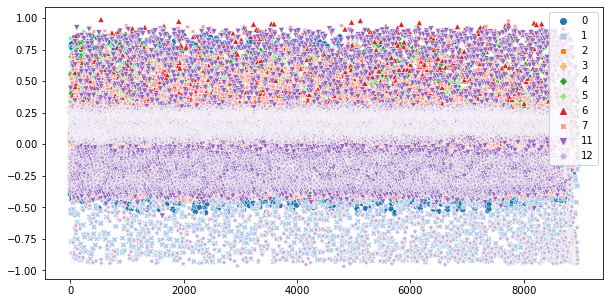

In [23]:
#linkage : {‘ward’, ‘complete’, ‘average’, ‘single’}, default=’ward’
aggModel = AgglomerativeClustering(n_clusters = 3, 
                                   affinity = 'euclidean', 
                                   linkage = 'ward')
results = aggModel.fit_predict(normalized_df)

labels = aggModel.labels_
clusters = pd.concat([normalized_df, pd.DataFrame({'cluster':labels})], axis = 1)

print("Silhouette Score: ", silhouette_score(normalized_df, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(normalized_df, results))
print("Davies Bouldin Score: ", davies_bouldin_score(normalized_df, results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax1 = sns.scatterplot(data = normalized_df, palette = "tab20")
plt.show()

Silhouette Score:  0.13985767196873358
Calinski Harabasz Score:  1267.608046247618
Davies Bouldin Score:  2.4178288020298577


Clusters count: 
1    3930
2    2516
0    2504
Name: cluster, dtype: int64


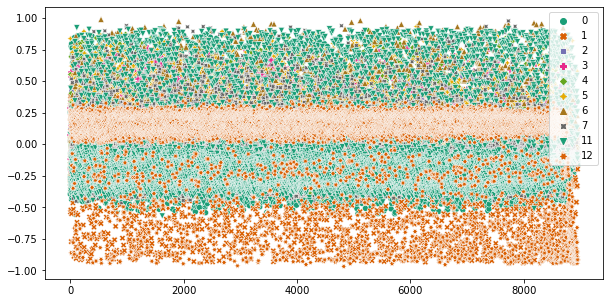

In [24]:
gmmModel = GaussianMixture(n_components = 3)

labels = gmmModel.fit_predict(normalized_df)
clusters = pd.concat([normalized_df, pd.DataFrame({'cluster':labels})], axis = 1)

print("Silhouette Score: ", silhouette_score(normalized_df, labels))
print("Calinski Harabasz Score: ", calinski_harabasz_score(normalized_df, labels))
print("Davies Bouldin Score: ", davies_bouldin_score(normalized_df, labels))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax2 = sns.scatterplot(data = normalized_df, palette = "Dark2")
plt.show()

##### E. Applying Modelling Techniques

##### PCA with feature selection

In [25]:
pca = PCA(n_components = 2)
dfPCA = pca.fit_transform(normalized_df)

dfPCA = pd.DataFrame(dfPCA)
dfPCA.columns = ['PCA1', 'PCA2']
dfPCA

,PCA1,PCA2
0,0.061246,-0.616802
1,-0.386571,0.315740
2,-0.342796,-0.096259
3,0.123489,-0.215128
4,-0.231434,-0.525088
...,...,...
8945,0.304189,0.122137
8946,0.097883,0.044153
8947,0.255562,0.033235
8948,0.211492,0.017021


In [26]:
dfPCACluster = pd.concat([dfPCA, pd.DataFrame({'cluster':labels})], axis = 1)
dfPCACluster

,PCA1,PCA2,cluster
0,0.061246,-0.616802,0
1,-0.386571,0.315740,2
2,-0.342796,-0.096259,1
3,0.123489,-0.215128,2
4,-0.231434,-0.525088,1
...,...,...,...
8945,0.304189,0.122137,2
8946,0.097883,0.044153,2
8947,0.255562,0.033235,2
8948,0.211492,0.017021,2


##### PCA without feature selection

In [27]:
#without drop
# Using PCA for dimension reduction
# It transforms the larger number of variables to smaller group containing most of information
pca = PCA(n_components = 2) 
dfPCA = pca.fit_transform(normalizedDF) 
dfPCA2 = pd.DataFrame(dfPCA) 
dfPCA2.columns = ['PCA1', 'PCA2'] 
dfPCA2

,PCA1,PCA2
0,-0.781181,0.096258
1,0.585582,-0.398602
2,0.185067,-0.334652
3,0.165833,0.118430
4,-0.738502,-0.196236
...,...,...
8945,-0.012522,0.297681
8946,-0.082502,0.086970
8947,-0.071971,0.251359
8948,-0.097783,0.208493


In [28]:
dfPCACluster2 = pd.concat([dfPCA2, pd.DataFrame({'cluster':labels})], axis = 1)
dfPCACluster2

,PCA1,PCA2,cluster
0,-0.781181,0.096258,0
1,0.585582,-0.398602,2
2,0.185067,-0.334652,1
3,0.165833,0.118430,2
4,-0.738502,-0.196236,1
...,...,...,...
8945,-0.012522,0.297681,2
8946,-0.082502,0.086970,2
8947,-0.071971,0.251359,2
8948,-0.097783,0.208493,2


##### (i) K-Means Clustering

##### when k = 2, PCA with feature selection

K-means inertia: 
3813.4405561129606


K-means cluster centers: 
[[ 4.81809445e-01 -5.92545473e-02 -6.66133815e-16]
 [-1.87162713e-01  2.30179005e-02  1.39031958e+00]]


Silhouette Score:  0.5098739881999612
Calinski Harabasz Score:  10102.157433680528
Davies Bouldin Score:  0.7120338521674902
Rand index:  0.7530917283601488


Clusters count: 
1    6446
0    2504
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



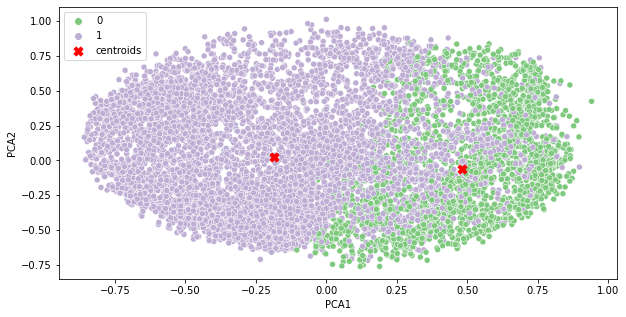

In [29]:
kmean = KMeans(n_clusters = 2, init = 'random', random_state = 42, n_init = 10)
results = kmean.fit_predict(dfPCACluster)

labels = kmean.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("K-means inertia: ")
print(kmean.inertia_)
print("\n")
print("K-means cluster centers: ")
print(kmean.cluster_centers_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, results))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labels, c = labels, palette = "Accent")
plt.scatter(kmean.cluster_centers_[:, 0], kmean.cluster_centers_[:, 1], marker = "X", c = "r", s = 80, label = "centroids")
plt.legend()
plt.show()

##### when k = 2, PCA without feature selection

K-means inertia: 
4491.387295741773


K-means cluster centers: 
[[-3.15219290e-03  4.88133688e-01 -4.44089210e-16]
 [ 1.22449442e-03 -1.89619416e-01  1.39031958e+00]]


Silhouette Score:  0.47798407133914217
Calinski Harabasz Score:  8595.537493922013
Davies Bouldin Score:  0.7594398157335756
Rand index:  0.7530917283601488


Clusters count: 
1    6446
0    2504
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



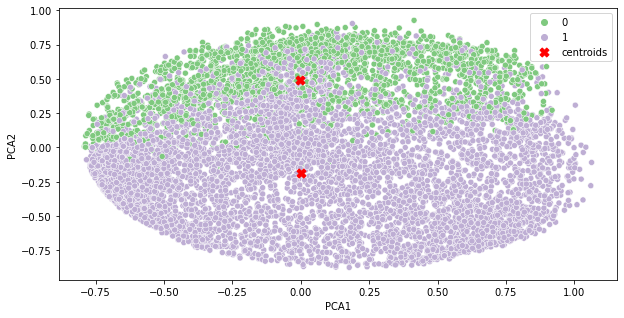

In [30]:
kmean = KMeans(n_clusters = 2, init = 'random', random_state = 42, n_init = 10)
results = kmean.fit_predict(dfPCACluster2)

labels = kmean.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("K-means inertia: ")
print(kmean.inertia_)
print("\n")
print("K-means cluster centers: ")
print(kmean.cluster_centers_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster2, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, results))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labels, c = labels, palette = "Accent")
plt.scatter(kmean.cluster_centers_[:, 0], kmean.cluster_centers_[:, 1], marker = "X", c = "r", s = 80, label = "centroids")
plt.legend()
plt.show()

##### when k = 3, PCA with feature selection

K-means inertia: 
2101.8097938566175


K-means cluster centers: 
[[ 2.00608782e-02  3.36376398e-02  2.00000000e+00]
 [-3.19827995e-01  1.62191056e-02  1.00000000e+00]
 [ 4.81809445e-01 -5.92545473e-02 -6.66133815e-16]]


Silhouette Score:  0.5348534764560161
Calinski Harabasz Score:  12806.494700913141
Davies Bouldin Score:  0.8094692187258872
Rand index:  1.0


Clusters count: 
1    3930
0    2516
2    2504
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



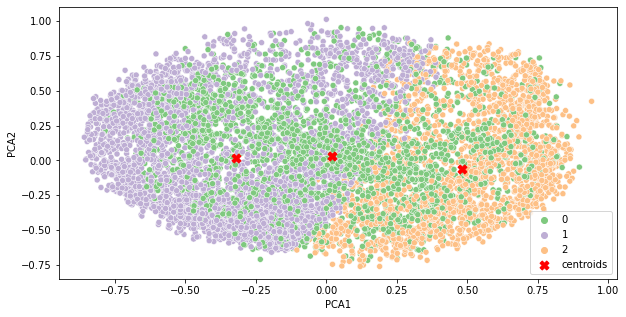

In [31]:
kmean = KMeans(n_clusters = 3, init = 'random', random_state = 42, n_init = 10)
results = kmean.fit_predict(dfPCACluster)

labels = kmean.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("K-means inertia: ")
print(kmean.inertia_)
print("\n")
print("K-means cluster centers: ")
print(kmean.cluster_centers_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, results))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labels, c = labels, palette = "Accent")
plt.scatter(kmean.cluster_centers_[:, 0], kmean.cluster_centers_[:, 1], marker = "X", c = "r", s = 80, label = "centroids")
plt.legend()
plt.show()

##### when k = 3, PCA without feature selection

K-means inertia: 
2766.937556615237


K-means cluster centers: 
[[ 4.62340013e-02  2.04635471e-02  2.00000000e+00]
 [-2.75907522e-02 -3.24115277e-01  1.00000000e+00]
 [-3.15219290e-03  4.88133688e-01 -4.44089210e-16]]


Silhouette Score:  0.49464562138326207
Calinski Harabasz Score:  9763.542569998843
Davies Bouldin Score:  0.935016857128269
Rand index:  1.0


Clusters count: 
1    3930
0    2516
2    2504
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



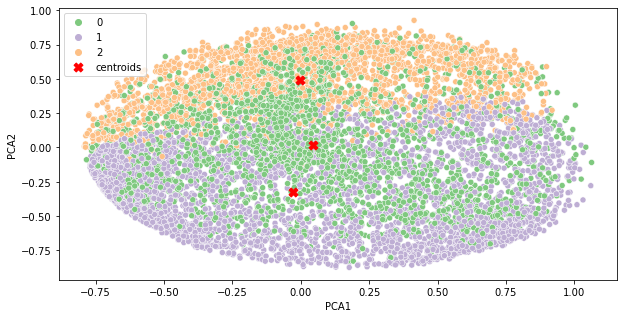

In [32]:
kmean = KMeans(n_clusters = 3, init = 'random', random_state = 42, n_init = 10)
results = kmean.fit_predict(dfPCACluster2)

labels = kmean.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("K-means inertia: ")
print(kmean.inertia_)
print("\n")
print("K-means cluster centers: ")
print(kmean.cluster_centers_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster2, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, results))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labels, c = labels, palette = "Accent")
plt.scatter(kmean.cluster_centers_[:, 0], kmean.cluster_centers_[:, 1], marker = "X", c = "r", s = 80, label = "centroids")
plt.legend()
plt.show()

##### when k = 4, PCA with feature selection

K-means inertia: 
1567.182545470255


K-means cluster centers: 
[[ 4.81809445e-01 -5.92545473e-02 -6.66133815e-16]
 [ 2.00608782e-02  3.36376398e-02  2.00000000e+00]
 [-3.05064500e-01  4.41251574e-01  1.00000000e+00]
 [-3.30931880e-01 -3.03455337e-01  1.00000000e+00]]


Silhouette Score:  0.5074860121744743
Calinski Harabasz Score:  12466.20018441418
Davies Bouldin Score:  0.7608898134352109
Rand index:  0.9054981081497824


Clusters count: 
1    2516
0    2504
3    2242
2    1688
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



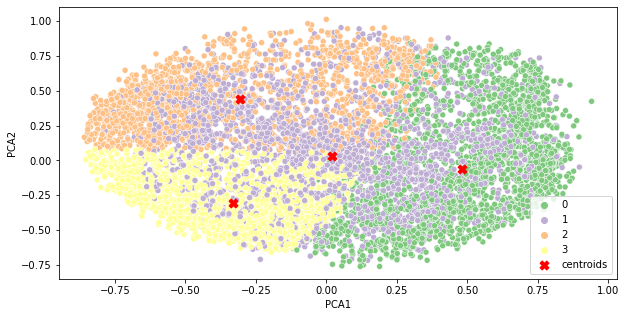

In [33]:
kmean = KMeans(n_clusters = 4, init = 'random', random_state = 0, n_init = 500, max_iter = 200)
results = kmean.fit_predict(dfPCACluster)

labels = kmean.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("K-means inertia: ")
print(kmean.inertia_)
print("\n")
print("K-means cluster centers: ")
print(kmean.cluster_centers_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster,results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, results))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax1 = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labels, c = labels, palette = "Accent")
plt.scatter(kmean.cluster_centers_[:, 0], kmean.cluster_centers_[:, 1], marker = "X", c = "r", s = 80, label = "centroids")
plt.legend()
plt.show()

##### when k = 4, PCA without feature selection

K-means inertia: 
1809.8406638589397


K-means cluster centers: 
[[ 5.06444598e-01 -3.63063507e-01  1.00000000e+00]
 [ 4.62340013e-02  2.04635471e-02  2.00000000e+00]
 [-3.15219290e-03  4.88133688e-01 -4.44089210e-16]
 [-4.81206661e-01 -2.91032192e-01  1.00000000e+00]]


Silhouette Score:  0.520260157933185
Calinski Harabasz Score:  11527.061772746923
Davies Bouldin Score:  0.6999505527569857
Rand index:  0.9042374573233425


Clusters count: 
1    2516
2    2504
3    2127
0    1803
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



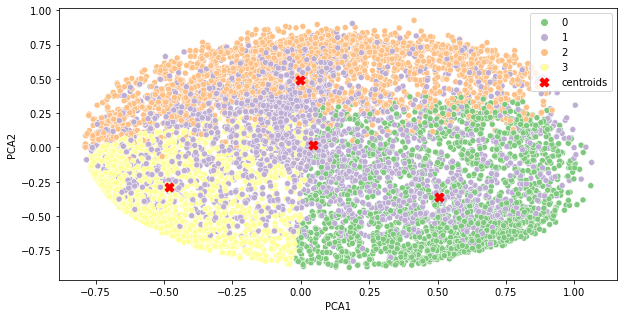

In [34]:
kmean = KMeans(n_clusters = 4, init = 'random', random_state = 0, n_init = 500, max_iter = 200)
results = kmean.fit_predict(dfPCACluster2)

labels = kmean.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("K-means inertia: ")
print(kmean.inertia_)
print("\n")
print("K-means cluster centers: ")
print(kmean.cluster_centers_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster2, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, results))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax1 = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labels, c = labels, palette = "Accent")
plt.scatter(kmean.cluster_centers_[:, 0], kmean.cluster_centers_[:, 1], marker = "X", c = "r", s = 80, label = "centroids")
plt.legend()
plt.show()

##### (ii) Agglomerative Clustering 

##### when no clusters is defined, PCA with feature selection

Silhouette Score:  0.5098739881999612
Calinski Harabasz Score:  10102.157433680528
Davies Bouldin Score:  0.7120338521674902
Rand index:  0.7530917283601488


Clusters count: 
1    2516
2    2504
3    2127
0    1803
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



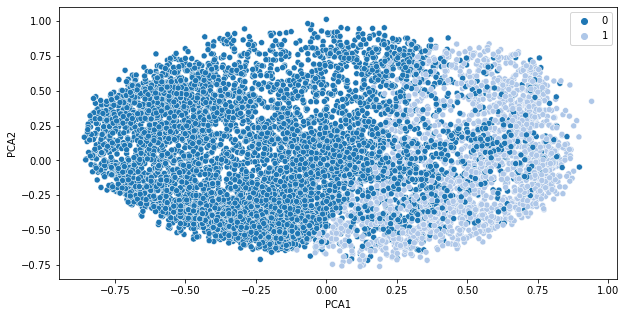

In [35]:
#linkage : {‘ward’, ‘complete’, ‘average’, ‘single’}, default=’ward’
aggModel = AgglomerativeClustering(affinity = 'euclidean', 
                                   linkage = 'ward')
results = aggModel.fit_predict(dfPCACluster)

labelsNoCluster = aggModel.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Silhouette Score: ", silhouette_score(dfPCACluster, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, results))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax2 = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labelsNoCluster,  palette = "tab20")
plt.show()


##### when no clusters is defined, PCA without feature selection

Silhouette Score:  0.47798407133914217
Calinski Harabasz Score:  8595.537493922013
Davies Bouldin Score:  0.7594398157335756
Rand index:  0.7530917283601488


Clusters count: 
1    2516
2    2504
3    2127
0    1803
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



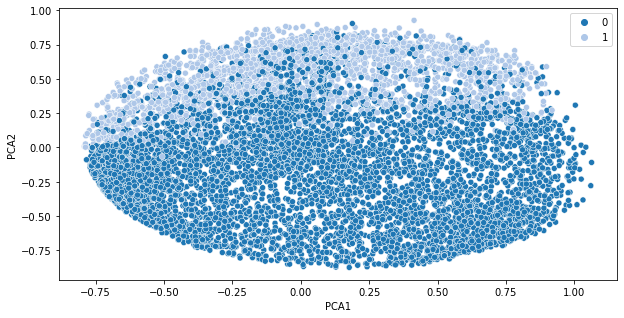

In [36]:
#linkage : {‘ward’, ‘complete’, ‘average’, ‘single’}, default=’ward’
aggModel = AgglomerativeClustering(affinity = 'euclidean', 
                                   linkage = 'ward')
results = aggModel.fit_predict(dfPCACluster2)

labelsNoCluster = aggModel.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Silhouette Score: ", silhouette_score(dfPCACluster2, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, results))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax2 = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labelsNoCluster,  palette = "tab20")
plt.show()


##### when clusters = 3, PCA with feature selection

Silhouette Score:  0.5348534764560161
Calinski Harabasz Score:  12806.494700913141
Davies Bouldin Score:  0.8094692187258872
Rand index:  1.0


Clusters count: 
0    3930
2    2516
1    2504
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



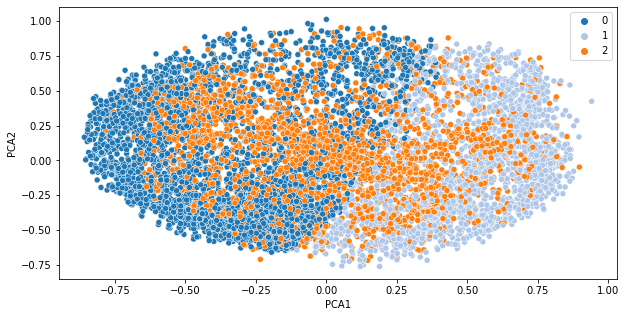

In [37]:
#linkage : {‘ward’, ‘complete’, ‘average’, ‘single’}, default=’ward’
aggModel = AgglomerativeClustering(n_clusters = 3, 
                                   affinity = 'euclidean', 
                                   linkage = 'ward')
results = aggModel.fit_predict(dfPCACluster)

labels = aggModel.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Silhouette Score: ", silhouette_score(dfPCACluster, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, results))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax3 = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labels,  palette = "tab20")
plt.show()

##### when clusters = 3, PCA without feature selection

Silhouette Score:  0.49464562138326207
Calinski Harabasz Score:  9763.542569998843
Davies Bouldin Score:  0.9350168571282692
Rand index:  1.0


Clusters count: 
0    3930
2    2516
1    2504
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



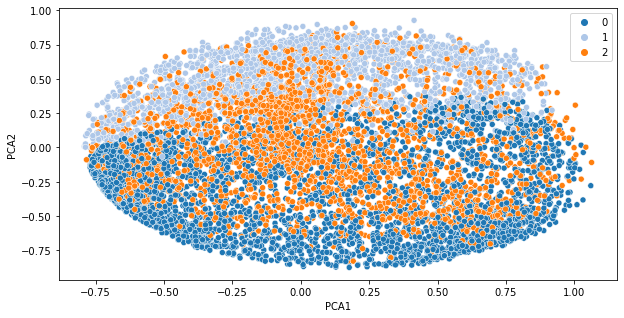

In [38]:
#linkage : {‘ward’, ‘complete’, ‘average’, ‘single’}, default=’ward’
aggModel = AgglomerativeClustering(n_clusters = 3, 
                                   affinity = 'euclidean', 
                                   linkage = 'ward')
results = aggModel.fit_predict(dfPCACluster2)

labels = aggModel.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Silhouette Score: ", silhouette_score(dfPCACluster2, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, results))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax3 = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labels,  palette = "tab20")
plt.show()

##### when clusters = 4, PCA with feature selection

Silhouette Score:  0.48780923658360453
Calinski Harabasz Score:  11878.846392958863
Davies Bouldin Score:  0.8000419911253167
Rand index:  0.9056966759495615


Clusters count: 
2    2516
0    2504
3    2256
1    1674
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



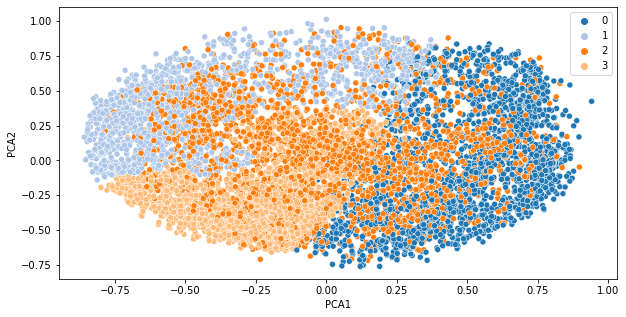

In [39]:
#linkage : {‘ward’, ‘complete’, ‘average’, ‘single’}, default=’ward’
aggModel = AgglomerativeClustering(n_clusters = 4, 
                                   affinity = 'euclidean', 
                                   linkage = 'ward')
results = aggModel.fit_predict(dfPCACluster)

labels = aggModel.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Silhouette Score: ", silhouette_score(dfPCACluster, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, results))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax3 = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labels,  palette = "tab20")
plt.show()

##### when clusters = 4, PCA without feature selection

Silhouette Score:  0.5032547325562914
Calinski Harabasz Score:  11036.476403097611
Davies Bouldin Score:  0.7320538721847565
Rand index:  0.904631521514529


Clusters count: 
2    2516
0    2504
1    2170
3    1760
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



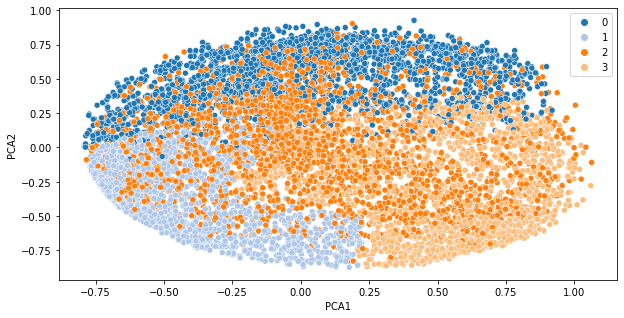

In [40]:
#linkage : {‘ward’, ‘complete’, ‘average’, ‘single’}, default=’ward’
aggModel = AgglomerativeClustering(n_clusters = 4, 
                                   affinity = 'euclidean', 
                                   linkage = 'ward')
results = aggModel.fit_predict(dfPCACluster2)

labels = aggModel.labels_
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Silhouette Score: ", silhouette_score(dfPCACluster2, results))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, results))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, results))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], results))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax3 = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labels,  palette = "tab20")
plt.show()

##### (iii) Gaussian Mixture Clustering 

##### when components = 2, PCA with feature selection

Gaussian Mixture converged log-likelihood: 
-0.023738052942771978


Number of iterations required for log-likelihood to converge: 
2


Silhouette Score:  0.4220402069651392
Calinski Harabasz Score:  6766.543944886747
Davies Bouldin Score:  0.8794958230334285
Rand index:  0.7542693512773501


Clusters count: 
1    6434
0    2516
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



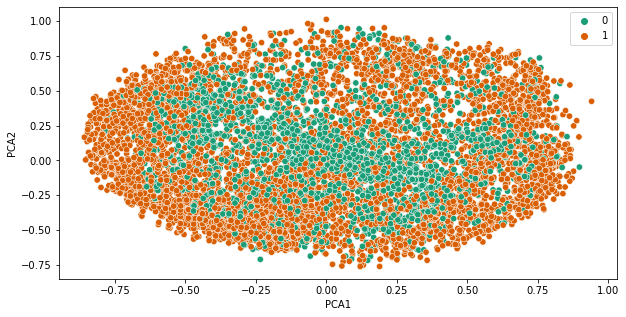

In [41]:
gm = GaussianMixture(n_components = 2, random_state = 42)

labels = gm.fit_predict(dfPCACluster)
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Gaussian Mixture converged log-likelihood: ")
print(gm.lower_bound_)
print("\n")
print("Number of iterations required for log-likelihood to converge: ")
print(gm.n_iter_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster, labels))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, labels))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, labels))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], labels))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax4 = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labels, s=40, palette = "Dark2")
plt.show()

##### when components = 2, PCA without feature selection

Gaussian Mixture converged log-likelihood: 
-0.22960326910498444


Number of iterations required for log-likelihood to converge: 
2


Silhouette Score:  0.3935590957408274
Calinski Harabasz Score:  5900.975220222713
Davies Bouldin Score:  0.9507918563419413
Rand index:  0.7542693512773501


Clusters count: 
1    6434
0    2516
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



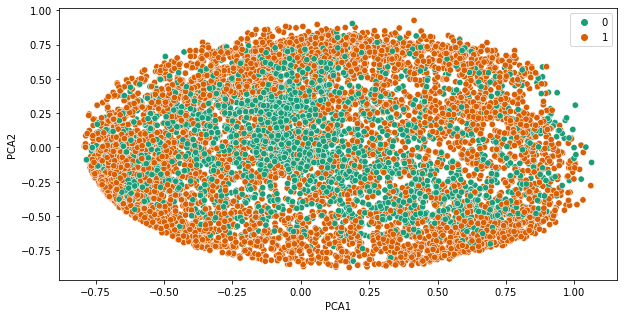

In [42]:
gm = GaussianMixture(n_components = 2, random_state = 42)

labels = gm.fit_predict(dfPCACluster2)
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Gaussian Mixture converged log-likelihood: ")
print(gm.lower_bound_)
print("\n")
print("Number of iterations required for log-likelihood to converge: ")
print(gm.n_iter_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster2, labels))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, labels))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, labels))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], labels))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax4 = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labels, s=40, palette = "Dark2")
plt.show()

##### when components = 3, PCA with feature selection

Gaussian Mixture converged log-likelihood: 
4.336041177807805


Number of iterations required for log-likelihood to converge: 
2


Silhouette Score:  0.5348534764560161
Calinski Harabasz Score:  12806.494700913141
Davies Bouldin Score:  0.8094692187258872
Rand index:  1.0


Clusters count: 
2    3930
0    2516
1    2504
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



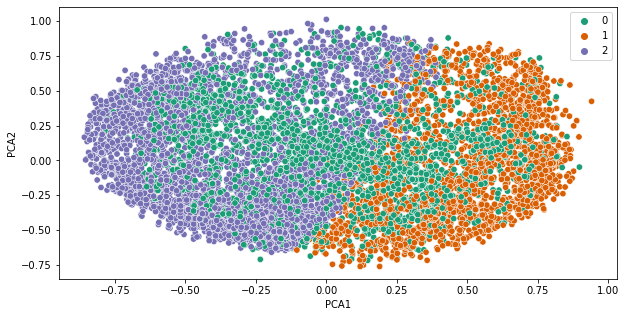

In [43]:
gm = GaussianMixture(n_components = 3, random_state = 42)

labels = gm.fit_predict(dfPCACluster)
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Gaussian Mixture converged log-likelihood: ")
print(gm.lower_bound_)
print("\n")
print("Number of iterations required for log-likelihood to converge: ")
print(gm.n_iter_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster, labels))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, labels))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, labels))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], labels))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax4 = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labels, s = 40, palette = "Dark2")
plt.show()

##### when components = 3, PCA without feature selection

Gaussian Mixture converged log-likelihood: 
4.152483284332426


Number of iterations required for log-likelihood to converge: 
2


Silhouette Score:  0.49464562138326207
Calinski Harabasz Score:  9763.542569998843
Davies Bouldin Score:  0.9350168571282692
Rand index:  1.0


Clusters count: 
2    3930
0    2516
1    2504
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



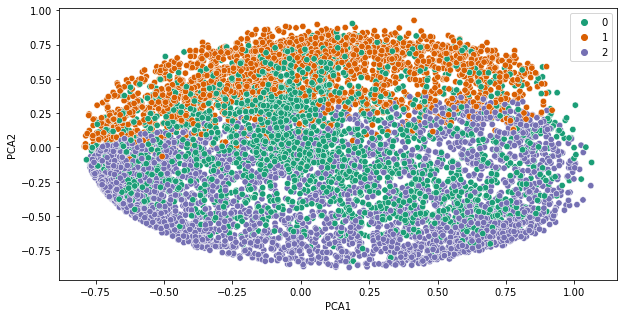

In [44]:
gm = GaussianMixture(n_components = 3, random_state = 42)

labels = gm.fit_predict(dfPCACluster2)
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Gaussian Mixture converged log-likelihood: ")
print(gm.lower_bound_)
print("\n")
print("Number of iterations required for log-likelihood to converge: ")
print(gm.n_iter_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster2, labels))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, labels))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, labels))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], labels))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax4 = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labels, s = 40, palette = "Dark2")
plt.show()

##### when components = 4, PCA with feature selection

Gaussian Mixture converged log-likelihood: 
4.443189671712319


Number of iterations required for log-likelihood to converge: 
8


Silhouette Score:  0.4960466317332311
Calinski Harabasz Score:  12246.914065427696
Davies Bouldin Score:  0.7739795147672611
Rand index:  0.9036470727043563


Clusters count: 
0    2516
1    2504
2    2016
3    1914
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



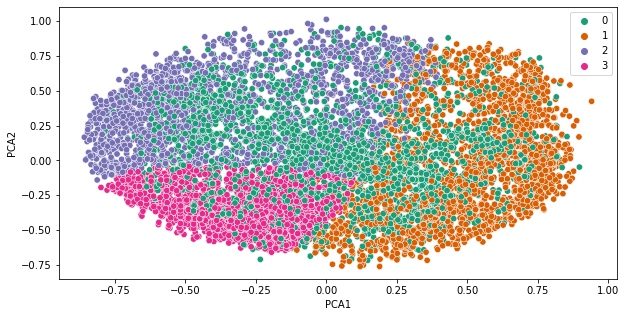

In [45]:
gm = GaussianMixture(n_components = 4, random_state = 42)

labels = gm.fit_predict(dfPCACluster)
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Gaussian Mixture converged log-likelihood: ")
print(gm.lower_bound_)
print("\n")
print("Number of iterations required for log-likelihood to converge: ")
print(gm.n_iter_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster, labels))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster, labels))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster, labels))
print("Rand index: ", metrics.rand_score(dfPCACluster['cluster'], labels))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax4 = sns.scatterplot(dfPCACluster['PCA1'], dfPCACluster['PCA2'], x = "PCA1", y = "PCA2", hue = labels, s = 40, palette = "Dark2")
plt.show()

##### when components = 4, PCA without feature selection

Gaussian Mixture converged log-likelihood: 
4.294581959010734


Number of iterations required for log-likelihood to converge: 
17


Silhouette Score:  0.4804328917555942
Calinski Harabasz Score:  10372.50329394306
Davies Bouldin Score:  0.7870490687545175
Rand index:  0.9092637047552519


Clusters count: 
0    2516
1    2504
3    2442
2    1488
Name: cluster, dtype: int64


C:\Users\chari\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



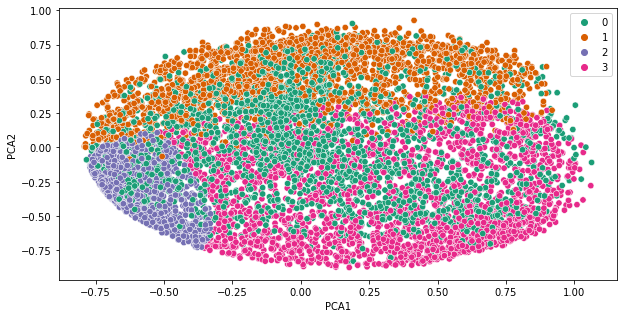

In [46]:
gm = GaussianMixture(n_components = 4, random_state = 42)

labels = gm.fit_predict(dfPCACluster2)
clusters = pd.concat([dfNew, pd.DataFrame({'cluster':labels})], axis = 1)

print("Gaussian Mixture converged log-likelihood: ")
print(gm.lower_bound_)
print("\n")
print("Number of iterations required for log-likelihood to converge: ")
print(gm.n_iter_)
print("\n")

print("Silhouette Score: ", silhouette_score(dfPCACluster2, labels))
print("Calinski Harabasz Score: ", calinski_harabasz_score(dfPCACluster2, labels))
print("Davies Bouldin Score: ", davies_bouldin_score(dfPCACluster2, labels))
print("Rand index: ", metrics.rand_score(dfPCACluster2['cluster'], labels))
print("\n")

print("Clusters count: ")
print(clusters['cluster'].value_counts())

plt.figure(figsize = (10,5))
ax4 = sns.scatterplot(dfPCACluster2['PCA1'], dfPCACluster2['PCA2'], x = "PCA1", y = "PCA2", hue = labels, s = 40, palette = "Dark2")
plt.show()

### Reference
https://scikit-learn.org/stable/modules/clustering.html#clustering-performance-evaluation